# Find Bubble Nucleation Sites

In [2]:
import numpy as np
import math
import matplotlib
import matplotlib.pyplot as plt
import scipy as scp
import scipy.optimize as sco
import scipy.signal as scs
from labellines import labelLines
from itertools import groupby, cycle
import scipy.ndimage
from scipy.ndimage import gaussian_filter1d

### Simulation Parameters 

In [3]:
nTime = 512
nSims = 10
splitdata = np.arange(0, nSims+1, 10)
filter_size2 = 11.768329733973772

lamb = 1.5; print('lamb = ', lamb)
phi0 = 2*np.pi/7.; print('phi0 = ', phi0)
nu = 2.*10**(-3)
m2eff = 4. * nu * (- 1. + lamb**2); print('m2eff = ', m2eff)
lenLat = 20. / np.sqrt(2. * nu); print('lenLat = ', lenLat)
phi_initial = np.pi

def V(phi):
    return ( -np.cos(phi) + 0.5 * lamb**2 * np.sin(phi)**2 ) * 4 * nu
right_phi_at_V_max = sco.minimize_scalar(lambda x: -V(x), bounds=[np.pi, 2*np.pi], method='bounded'); print(right_phi_at_V_max.x)
far_right_phi_at_V_max = sco.minimize_scalar(lambda x: -V(x), bounds=[2*np.pi, 3*np.pi], method='bounded'); print(far_right_phi_at_V_max.x)
threshold = right_phi_at_V_max.x + np.abs(right_phi_at_V_max.x-2*phi_initial)*0.5; print(threshold)

lamb =  1.5
phi0 =  0.8975979010256552
m2eff =  0.01
lenLat =  316.22776601683796
4.251836544352809
8.314534070006756
5.267510925766198


In [21]:
def weave(list1,list2):
    lijst = []
    i = 0
    while i < len(list1):
        lijst.append(list1[i])
        lijst.append(list2[i]) 
        i += 1
    return lijst

def find_peak_positions(slice, threshold):
    """ Finds x coordinate of peaks in masked field with mask applied at threshold. """
    peak_coord = scs.find_peaks(slice, height = threshold)[0].tolist()
    if slice[-1] >= threshold and slice[0] >= threshold and slice[-1] != slice[0]:
        if slice[0] > slice[-1] and slice[0] > slice[1]:
            peak_coord.append(0)
        elif slice[0] < slice[-1] and slice[-1] > slice[-2]:
            peak_coord.append(len(slice)-1) # this minds potential boundary discontinuities
    return np.asarray(peak_coord)

def identify_bubble_sites(simulation, bubble_thr, nLat):
    nvals, new_vals = 0, 0
    vals, times = [], []
    for t in range(tTime - int(tcheck//2)):
        # find new peaks in field and check if they are good bubble candidates
        peaks_new = find_peak_positions(simulation[t], bubble_thr)
        if peaks_new is not None:
            for pk in peaks_new:
                # ensure new peaks are not in the light cone of the previously identified bubble nucleation sites
                target_bounds = []
                for v in range(len(vals)):
                    target_bounds += [i%nLat for i in range(vals[v] - np.abs(t+1 - times[v])*light_cone, vals[v] + np.abs(t+1 - times[v])*light_cone)]
                if pk not in target_bounds:
                    vals.append(pk)
                    times.append(t)

                # discard element if future lightcone is not in tv
                if len(vals) > nvals:
                    for temp in range(times[-1], min(times[-1]+tcheck, tTime)):
                        boolShoot = False
                        deltat = temp-1 - times[-1]
                        for xemp in range(vals[-1] - deltat*light_cone, vals[-1] + deltat*light_cone + 1):
                            if not (bubble_thr < simulation[temp][xemp%nLat] < far_right_phi_at_V_max.x):#3*phi_initial):
                                vals = np.delete(np.asarray(vals), -1).tolist()
                                times = np.delete(np.asarray(times), -1).tolist()
                                boolShoot = True
                                break
                        if boolShoot:
                            break
                
                if len(vals) > nvals:
                    if any(simulation[pastt][vals[-1]] < 0 for pastt in range(times[-1])):
                        vals = np.delete(np.asarray(vals), -1).tolist()
                        times = np.delete(np.asarray(times), -1).tolist()

                if len(vals) > nvals:
                    bubbles = find_bubbles_at_t(simulation[t], bubble_thr)
                    nBubbles = len(bubbles)
                    bub_list, rmvlist = [], []
                    for v in range(nvals):
                        for index in range(nBubbles):
                             if (vals[v] in bubbles[index]):
                                bub_list.append(index)
                    bubbles_dup = [bubbles[index] for index in range(nBubbles) if index in set(bub_list)]
                    if bubbles_dup != []:
                        for bounds in bubbles_dup:
                            for c in range(nvals, len(vals)):
                                if (vals[c] in bounds):
                                    rmvlist.append(c)
                    if len(rmvlist) > 0:
                        vals = np.delete(np.asarray(vals), rmvlist).tolist()
                        times = np.delete(np.asarray(times), rmvlist).tolist()

                nvals = len(vals)
    newlist = []
    for v in range(len(times)):
        if times[v] == 0:
            newlist.append(v)
        if all(right_phi_at_V_max.x < simulation[times[v]][xemp%nLat] for xemp in range(vals[v] - tcheck*light_cone)) and any(right_phi_at_V_max.x > simulation[times[v]][xemp%nLat] for xemp in range(vals[v] + tcheck*light_cone + 1)):
            newlist.append(v)
        elif any(right_phi_at_V_max.x > simulation[times[v]][xemp%nLat] for xemp in range(vals[v] - tcheck*light_cone)) and all(right_phi_at_V_max.x < simulation[times[v]][xemp%nLat] for xemp in range(vals[v] + tcheck*light_cone + 1)):
            newlist.append(v)
    vals = np.delete(np.asarray(vals), newlist).tolist()
    times = np.delete(np.asarray(times), newlist).tolist()
    return [[times[i], vals[i]] for i in range(len(vals))]

def find_bubbles_at_t(field_slice, bubble_thr):
    bubbles, mids = [], []
    vals = [x if field_slice[x] > right_phi_at_V_max.x else 0 for x in range(len(field_slice))]
    first_zero = next((i for i, x in enumerate(vals) if x == 0.), 0)
    vals = np.roll(vals, -first_zero)
    bubbles = [list(g) for k, g in groupby(vals, lambda x: x != 0) if k]
    for bubble in bubbles:
        if bubble[0] <= bubble[-1]:
            aa = np.arange(bubble[0], bubble[-1]+1)
        elif bubble[0] > bubble[-1]:
            bubble[0] = bubble[0]-nLat
            aa = np.arange(bubble[0], bubble[-1]+1)%nLat
        mids.append(aa)
    return mids

def all_bubble_sites(data, bubble_thr):
    return [identify_bubble_sites(simulation, bubble_thr) for simulation in data]

dx, dk, spec  1.2352647110032733 0.0198691765315922 128
dtout/dt =  4.0
light_cone =  0
tcheck = 6


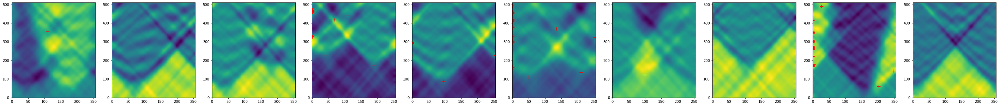

dx, dk, spec  0.6176323555016366 0.0198691765315922 128
dtout/dt =  8.0
light_cone =  1
tcheck = 6


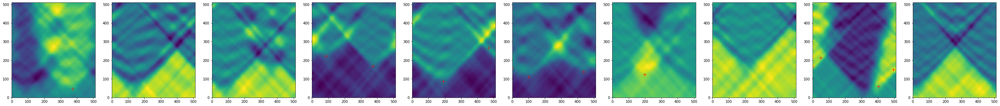

dx, dk, spec  0.3088161777508183 0.0198691765315922 128
dtout/dt =  16.0
light_cone =  2
tcheck = 6


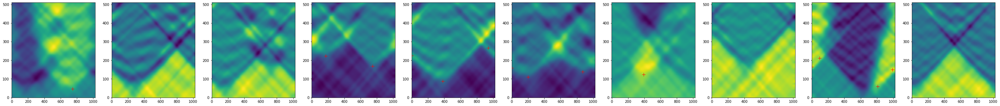

dx, dk, spec  0.15440808887540916 0.0198691765315922 128
dtout/dt =  32.0
light_cone =  4
tcheck = 6


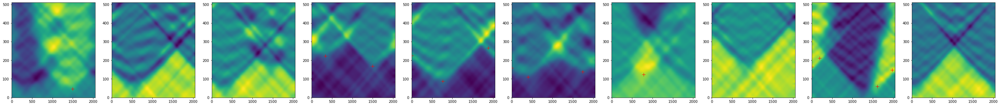

dx, dk, spec  0.07720404443770458 0.0198691765315922 128
dtout/dt =  64.0
light_cone =  8
tcheck = 6


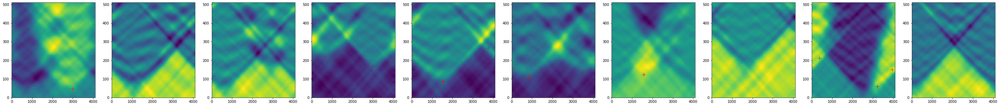

In [5]:
all_all_targets = []
for jjj in [1,2,4,8,16]:
    nLat = 256*jjj
    nyq = nLat//2+1; spec = 128; dx = lenLat/nLat; dk = 2.*np.pi/lenLat; print('dx, dk, spec ', dx, dk, spec)
    alpha = 8.; n_cross = 2; dt = dx/alpha; outsize = 4*nLat*n_cross/nTime; dtout = outsize*dt; print('dtout/dt = ', dtout/dt)
    light_cone = int(dtout/dx); print('light_cone = ', light_cone); tTime = nTime; tcheck = int(dtout/np.sqrt(m2eff)); print('tcheck =', tcheck)

    def sim_location(spec, sim):
        return '/gpfs/dpirvu/bubble_correlations/kcut'+str(spec)+'_t'+str(nTime)+'_x'+str(nLat)+'_len{:.4f}'.format(lenLat)+'_phi0{:.4f}'.format(phi0)+'_lamb{:.4f}'.format(lamb)+'_alph{:.4f}'.format(alpha)+'_spec'+str(spec)+'_sim'+str(sim)+'_fields.dat'

    for minSim, maxSim in zip(splitdata, splitdata[1:]):
        data = [np.reshape(np.genfromtxt(sim_location(spec, sim)), (nTime, nLat)) for sim in range(minSim, maxSim)]
        data = [[gaussian_filter1d(slice, sigma=filter_size2/2.*jjj, mode='wrap') for slice in simulation[-tTime:]] for simulation in data]
    
#    fig, ax = plt.subplots(2, int(len(data)/2), figsize = (5*int(len(data)/2), 11))
    fig, ax = plt.subplots(1, len(data), figsize = (len(data)*5, 5))
    all_targets = []
    for sim in range(len(data)):
        target = identify_bubble_sites(data[sim], threshold)
        all_targets.append([(tar[0], int(tar[1]/jjj)) for tar in target])
#        print('for threshold = {:.4f}'.format(threshold), 'there are', len(target), 'bubbles at (t, x):', target)

#        if sim in range(int(len(data)/2)): j = 0
#        else: j = 1
        for tg in target:
#            ax[j][sim%int(len(data)/2)].plot(tg[1], tg[0]/jjj, color='r', linestyle="None", marker = '+', ms=10)
            ax[sim].plot(tg[1], tg[0], color='r', linestyle="None", marker = '+', ms=10)
        im = ax[sim].imshow(data[sim], aspect='auto', interpolation='none', origin='lower')
    plt.show()
    
    all_all_targets.append(all_targets)

In [17]:
Targets = np.asarray(all_all_targets)
for i in range(len(Targets[0])):
    for j in range(len(Targets)):
        print(Targets[j,i])

[(47, 187), (355, 110)]
[(47, 187)]
[(47, 186)]
[(47, 186)]
[(47, 186)]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[(174, 187), (226, 41), (327, 0), (328, 0), (419, 69), (444, 110), (458, 0), (459, 0), (460, 0), (461, 0), (462, 0), (463, 0), (464, 0), (465, 0), (466, 0), (467, 0), (468, 0), (469, 0), (470, 0), (471, 0), (472, 0)]
[(169, 187), (223, 42)]
[(169, 187), (223, 42)]
[(169, 187), (223, 42)]
[(169, 187), (223, 42)]
[(87, 95), (223, 0), (224, 0), (225, 0), (226, 0), (227, 255), (289, 0), (290, 0), (291, 0), (292, 0), (293, 0), (294, 0), (295, 0), (296, 0), (297, 0), (298, 0), (299, 0), (300, 0)]
[(88, 95), (226, 0), (266, 235)]
[(88, 95), (226, 0), (266, 235)]
[(88, 95), (226, 0), (266, 235)]
[(88, 95), (226, 0), (266, 235)]
[(111, 50), (134, 210), (160, 0), (161, 0), (162, 0), (163, 0), (164, 0), (295, 0), (296, 0), (297, 0), (298, 0), (299, 0), (300, 0), (301, 0), (302, 0), (303, 0), (304, 0), (305, 0), (306, 0), (307, 0), (324, 253), (326, 0), (327, 0), (328, 0), (329, 0), (371, 135), (3

dx, dk, spec  0.6176323555016366 0.0198691765315922 256
dtout/dt =  8.0
light_cone =  1
tcheck = 6


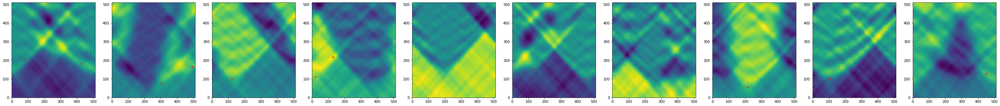

dx, dk, spec  0.3088161777508183 0.0198691765315922 256
dtout/dt =  16.0
light_cone =  2
tcheck = 6


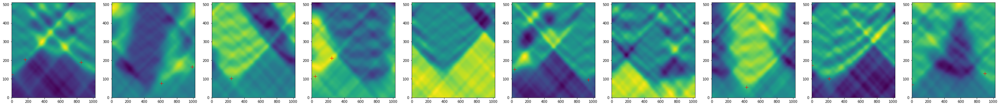

dx, dk, spec  0.15440808887540916 0.0198691765315922 256
dtout/dt =  32.0
light_cone =  4
tcheck = 6


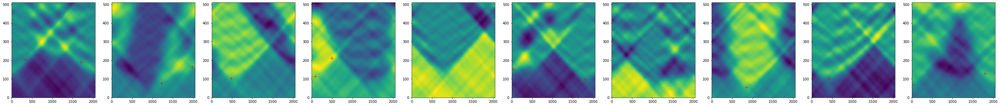

dx, dk, spec  0.07720404443770458 0.0198691765315922 256
dtout/dt =  64.0
light_cone =  8
tcheck = 6


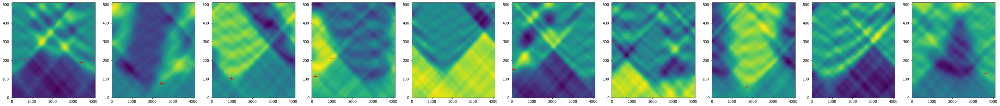

In [13]:
all_all_targets = []
for jjj in [1,2,4,8]:
    nLat = 512*jjj
    nyq = nLat//2+1; spec = 256; dx = lenLat/nLat; dk = 2.*np.pi/lenLat; print('dx, dk, spec ', dx, dk, spec)
    alpha = 8.; n_cross = 2; dt = dx/alpha; outsize = 4*nLat*n_cross/nTime; dtout = outsize*dt; print('dtout/dt = ', dtout/dt)
    light_cone = int(dtout/dx); print('light_cone = ', light_cone); tTime = nTime; tcheck = int(dtout/np.sqrt(m2eff)); print('tcheck =', tcheck)

    def sim_location(spec, sim):
        return '/gpfs/dpirvu/bubble_correlations/kcut'+str(spec)+'_t'+str(nTime)+'_x'+str(nLat)+'_len{:.4f}'.format(lenLat)+'_phi0{:.4f}'.format(phi0)+'_lamb{:.4f}'.format(lamb)+'_alph{:.4f}'.format(alpha)+'_spec'+str(spec)+'_sim'+str(sim)+'_fields.dat'

    for minSim, maxSim in zip(splitdata, splitdata[1:]):
        data = [np.reshape(np.genfromtxt(sim_location(spec, sim)), (nTime, nLat)) for sim in range(minSim, maxSim)]
        data = [[gaussian_filter1d(slice, sigma=filter_size2*jjj, mode='wrap') for slice in simulation[-tTime:]] for simulation in data]
    
#    fig, ax = plt.subplots(2, int(len(data)/2), figsize = (5*int(len(data)/2), 11))
    fig, ax = plt.subplots(1, len(data), figsize = (len(data)*5, 5))
    all_targets = []
    for sim in range(len(data)):
        target = identify_bubble_sites(data[sim], threshold)
        all_targets.append([(tar[0], int(tar[1]/jjj)) for tar in target])
#        print('for threshold = {:.4f}'.format(threshold), 'there are', len(target), 'bubbles at (t, x):', target)

#        if sim in range(int(len(data)/2)): j = 0
#        else: j = 1
        for tg in target:
#            ax[j][sim%int(len(data)/2)].plot(tg[1], tg[0]/jjj, color='r', linestyle="None", marker = '+', ms=10)
            ax[sim].plot(tg[1], tg[0], color='r', linestyle="None", marker = '+', ms=10)
        im = ax[sim].imshow(data[sim], aspect='auto', interpolation='none', origin='lower')
    plt.show()
    
    all_all_targets.append(all_targets)

In [14]:
Targets = np.asarray(all_all_targets)
for i in range(len(Targets[0])):
    for j in range(len(Targets)):
        print(Targets[j,i])

[(123, 0), (182, 427), (204, 82)]
[(124, 0), (189, 426), (205, 82)]
[(124, 0), (189, 426), (205, 82)]
[(124, 0), (189, 426), (205, 82)]
[(77, 306), (165, 494)]
[(77, 306), (165, 493)]
[(77, 306), (165, 493)]
[(77, 306), (165, 493)]
[(102, 121)]
[(102, 120)]
[(102, 120)]
[(102, 120)]
[(112, 21), (217, 129)]
[(114, 20), (212, 122)]
[(114, 20), (212, 122)]
[(114, 20), (212, 122)]
[]
[]
[]
[]
[(97, 449), (152, 131)]
[(95, 470), (152, 17)]
[(96, 450), (151, 12)]
[(96, 450), (151, 12)]
[]
[]
[]
[]
[(56, 214)]
[(56, 214)]
[(56, 214)]
[(56, 214)]
[(101, 107), (172, 0)]
[(100, 106), (172, 0)]
[(100, 106), (172, 0)]
[(100, 106), (172, 0)]
[(68, 0), (128, 450)]
[(68, 0), (129, 449)]
[(68, 0), (129, 449)]
[(68, 0), (129, 449)]


dx, dk, spec  1.2352647110032733 0.0198691765315922 128
dtout/dt =  4.0
light_cone =  0
tcheck = 6


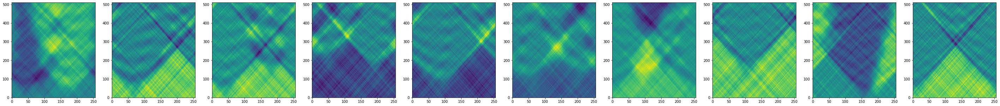

dx, dk, spec  0.6176323555016366 0.0198691765315922 128
dtout/dt =  8.0
light_cone =  1
tcheck = 6


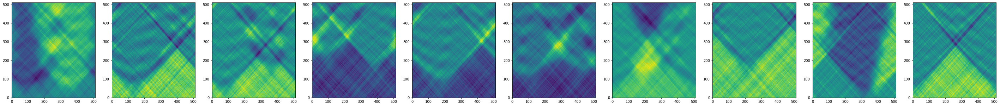

dx, dk, spec  0.3088161777508183 0.0198691765315922 128
dtout/dt =  16.0
light_cone =  2
tcheck = 6


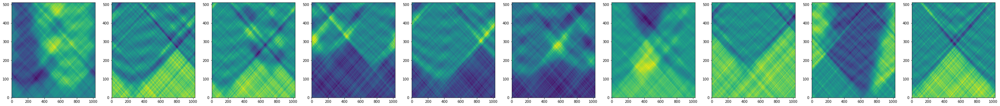

dx, dk, spec  0.15440808887540916 0.0198691765315922 128
dtout/dt =  32.0
light_cone =  4
tcheck = 6


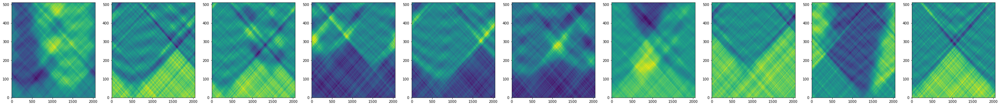

dx, dk, spec  0.07720404443770458 0.0198691765315922 128
dtout/dt =  64.0
light_cone =  8
tcheck = 6


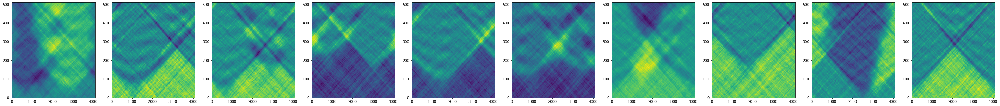

In [19]:
for jjj in [1,2,4,8,16]:
    nLat = 256*jjj
    nyq = nLat//2+1; spec = 128; dx = lenLat/nLat; dk = 2.*np.pi/lenLat; print('dx, dk, spec ', dx, dk, spec)
    alpha = 8.; n_cross = 2; dt = dx/alpha; outsize = 4*nLat*n_cross/nTime; dtout = outsize*dt; print('dtout/dt = ', dtout/dt)

    def sim_location(spec, sim):
        return '/gpfs/dpirvu/bubble_correlations/kcut'+str(spec)+'_t'+str(nTime)+'_x'+str(nLat)+'_len{:.4f}'.format(lenLat)+'_phi0{:.4f}'.format(phi0)+'_lamb{:.4f}'.format(lamb)+'_alph{:.4f}'.format(alpha)+'_spec'+str(spec)+'_sim'+str(sim)+'_fields.dat'
    for minSim, maxSim in zip(splitdata, splitdata[1:]):
        data = [np.reshape(np.genfromtxt(sim_location(spec, sim)), (nTime, nLat)) for sim in range(minSim, maxSim)]
    fig, ax = plt.subplots(1, len(data), figsize = (len(data)*5, 5))
    im = [ax[sim].imshow(data[sim], aspect='auto', interpolation='none', origin='lower') for sim in range(len(data))]
    plt.show()

In [1]:
# for jjj in [1,2,4,8]:
#     nLat = 512*jjj
#     nyq = nLat//2+1; spec = 256; dx = lenLat/nLat; dk = 2.*np.pi/lenLat; print('dx, dk, spec ', dx, dk, spec)
#     alpha = 8.; n_cross = 2; dt = dx/alpha; outsize = 4*nLat*n_cross/nTime; dtout = outsize*dt; print('dtout/dt = ', dtout/dt)

#     def sim_location(spec, sim):
#         return '/gpfs/dpirvu/bubble_correlations/kcut'+str(spec)+'_t'+str(nTime)+'_x'+str(nLat)+'_len{:.4f}'.format(lenLat)+'_phi0{:.4f}'.format(phi0)+'_lamb{:.4f}'.format(lamb)+'_alph{:.4f}'.format(alpha)+'_spec'+str(spec)+'_sim'+str(sim)+'_fields.dat'
#     for minSim, maxSim in zip(splitdata, splitdata[1:]):
#         data = [np.reshape(np.genfromtxt(sim_location(spec, sim)), (nTime, nLat)) for sim in range(minSim, maxSim)]
#     fig, ax = plt.subplots(1, len(data), figsize = (len(data)*5, 5))
#     im = [ax[sim].imshow(data[sim], aspect='auto', interpolation='none', origin='lower') for sim in range(len(data))]
#     plt.show()

In [2]:
# for jjj in [1,2,4]:
#     nLat = 1024*jjj
#     nyq = nLat//2+1; spec = 512; dx = lenLat/nLat; dk = 2.*np.pi/lenLat; print('dx, dk, spec ', dx, dk, spec)
#     alpha = 8.; n_cross = 2; dt = dx/alpha; outsize = 4*nLat*n_cross/nTime; dtout = outsize*dt; print('dtout/dt = ', dtout/dt)

#     def sim_location(spec, sim):
#         return '/gpfs/dpirvu/bubble_correlations/kcut'+str(spec)+'_t'+str(nTime)+'_x'+str(nLat)+'_len{:.4f}'.format(lenLat)+'_phi0{:.4f}'.format(phi0)+'_lamb{:.4f}'.format(lamb)+'_alph{:.4f}'.format(alpha)+'_spec'+str(spec)+'_sim'+str(sim)+'_fields.dat'
#     for minSim, maxSim in zip(splitdata, splitdata[1:]):
#         data = [np.reshape(np.genfromtxt(sim_location(spec, sim)), (nTime, nLat)) for sim in range(minSim, maxSim)]
#     fig, ax = plt.subplots(1, len(data), figsize = (len(data)*5, 5))
#     im = [ax[sim].imshow(data[sim], aspect='auto', interpolation='none', origin='lower') for sim in range(len(data))]
#     plt.show()